# Procesamiento Digital de Imágenes - TP04: Procesamiento de Color

**Objetivos de la guía:**

* Reforzar conceptos de espacios y modelos de color (RGB, HSV, HSI).
* Estudiar los procedimientos en el manejo de imágenes multicromáticas y segmentación.
* Abordar problemas reales como pseudocolor y detección de deforestación.



In [18]:
# Configuración Inicial
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntRangeSlider, IntSlider, Checkbox, FloatSlider
import ipywidgets as widgets

def mostrar_imagenes(imagenes, titulos, figsize=(15, 5)):
    """Función para mostrar múltiples imágenes correctamente en RGB"""
    n = len(imagenes)
    fig, axs = plt.subplots(1, n, figsize=figsize)
    if n == 1: axs = [axs]
    for i in range(n):
        img = imagenes[i]
        # Convertir BGR a RGB si es una imagen a color (3 canales)
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axs[i].imshow(img, cmap='gray' if len(img.shape) == 2 else None, vmin=0, vmax=255)
        axs[i].set_title(titulos[i])
        axs[i].axis('off')
    plt.show()

print("Entorno configurado. Sube las imágenes: patron.tif, rosas.jpg, rio.jpg, chairs_oscura.jpg, camino.tif, futbol.jpg y Deforestacion.png")


Entorno configurado. Sube las imágenes: patron.tif, rosas.jpg, rio.jpg, chairs_oscura.jpg, camino.tif, futbol.jpg y Deforestacion.png


## Ejercicio 1: Modelos de color y análisis

Aprenderemos a separar canales `cv2.split`, fusionarlos `cv2.merge` y manipular el espacio HSV para obtener colores complementarios.

**Observación**:
* En OpenCV, el canal **H** va de **0 a 179**.
* Como el complementario se halla desfasando **180** grados, entonces son **90** en la escala de OpenCV.

> Se ve la contribucion de cada canal (rojo, verde y azul) en la imagen, por eso vemos que el canal rojo aporta solo del lado izquierdo del patron (donde estan los rojos cada vez mas "puros") pero en el derecho (donde esta los azules cada vez mas "puros"). Lo mismo pasa con el verde, que se concentra en el centro.
>
> En cuanto a los canales HSV, la saturación y el valor de brillo son constantes en toda la imagen, la saturación en blanco ya que todos los colores son vibrantes, y el brillo en un gris que oscurece todo el patrón. El tono (H) se ve como un degradé de grises (del rojo al azul, que corresponden a valores de 0 a 120)

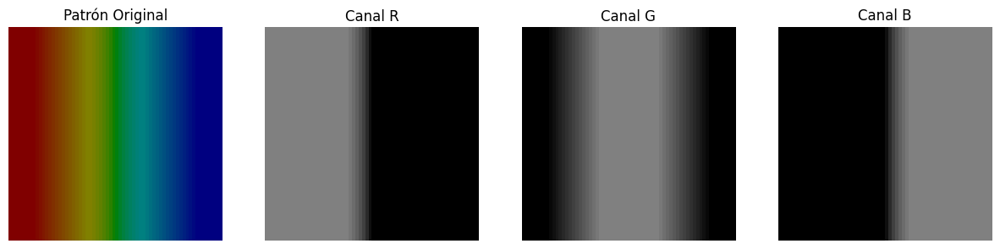

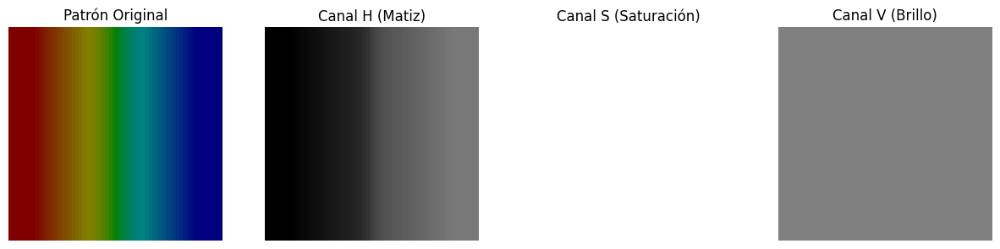

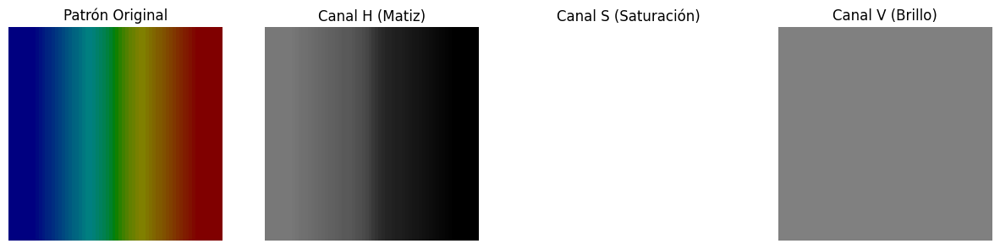

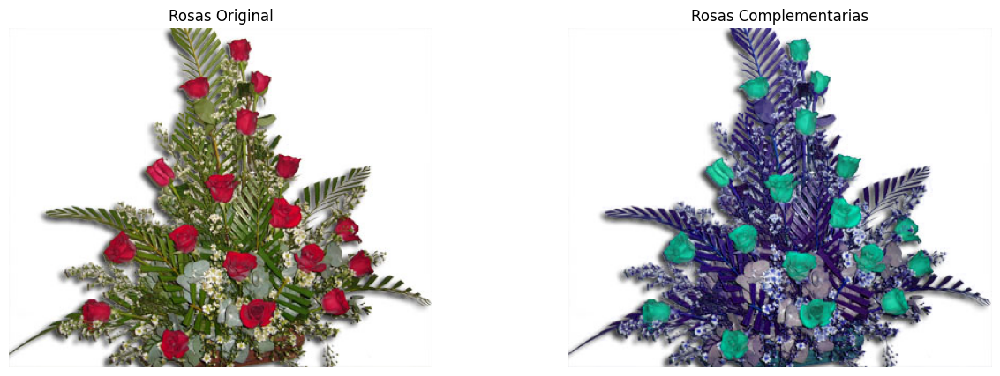

In [19]:
# Canales y Colores Complementarios

def analizar_modelos_color():
    # 1.1 Patrón de colores (Rojo a Azul)
    patron = cv2.imread('imagenes/patron.tif')
    if patron is not None:
        # Extraer canales B, G, R (OpenCV usa BGR por defecto)
        B, G, R = cv2.split(patron)

        # Convertir a HSV y separar canales
        patron_hsv = cv2.cvtColor(patron, cv2.COLOR_BGR2HSV)
        H, S, V = cv2.split(patron_hsv)

        mostrar_imagenes([patron, R, G, B], ["Patrón Original", "Canal R", "Canal G", "Canal B"])
        mostrar_imagenes([patron, H, S, V], ["Patrón Original", "Canal H (Matiz)", "Canal S (Saturación)", "Canal V (Brillo)"])

        # TODO: Modifique H, S, V para obtener variación de azul a rojo, con S y V máximos (255).
        H_nuevo = -H + 120   # [0, 120] -> [120, 0]
        S_nuevo = S
        V_nuevo = V
        patron_nuevo_hsv = cv2.merge([H_nuevo, S_nuevo, V_nuevo])
        patron_nuevo_rgb = cv2.cvtColor(patron_nuevo_hsv, cv2.COLOR_HSV2BGR)

        mostrar_imagenes([patron_nuevo_rgb, H_nuevo, S_nuevo, V_nuevo], ["Patrón Original", "Canal H (Matiz)", "Canal S (Saturación)", "Canal V (Brillo)"])

    # 1.2 Colores Complementarios
    rosas = cv2.imread('imagenes/rosas.jpg')
    if rosas is not None:
        rosas_hsv = cv2.cvtColor(rosas, cv2.COLOR_BGR2HSV)
        H_r, S_r, V_r = cv2.split(rosas_hsv)

        # TODO: Generar la imagen complementaria
        H_comp = np.where(H_r < 79, H_r + 90, H_r-90)
        rosas_comp_hsv = cv2.merge([H_comp, S_r, V_r])
        rosas_comp = cv2.cvtColor(rosas_comp_hsv, cv2.COLOR_HSV2BGR)

        mostrar_imagenes([rosas, rosas_comp], ["Rosas Original", "Rosas Complementarias"])
        pass

analizar_modelos_color()

### Ejercicio 1.3:

Crear una función interactiva con sliders que trace los perfiles de intensidad de R, G, B juntos, y H, S, V juntos para una fila dada.

In [20]:
lapices = cv2.imread("imagenes/lapices02.jpg", cv2.IMREAD_COLOR_RGB)
R, G, B = cv2.split(lapices)
H, S, V = cv2.split(cv2.cvtColor(lapices, cv2.COLOR_BGR2HSV))

# funcion de actualizacion
def actualizar(row):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))

    # img
    ax[0].imshow(lapices, cmap="gray")
    ax[0].plot([0, lapices.shape[1]-1], [row, row], c="blue")
    ax[0].set_title("Original")
    ax[0].axis("off")

    # RGB
    ax[1].plot(R[row,:], c="red", label="R")
    ax[1].plot(G[row,:], c="green", label="G")
    ax[1].plot(B[row,:], c="blue", label="B")
    ax[1].set_title("RGB")
    ax[1].legend()

    # HSV
    ax[2].plot(H[row,:], c="cyan", label="H")
    ax[2].plot(S[row,:], c="magenta", label="S")
    ax[2].plot(V[row,:], c="yellow", label="V")
    ax[2].set_title("HSV")
    ax[2].legend()

    plt.tight_layout()
    plt.show()

interact(
    actualizar,
    row=IntSlider(
        value=100,
        min=2,
        max=lapices.shape[0],
        step=1,
        description="fila"
    )
);

interactive(children=(IntSlider(value=100, description='fila', max=762, min=2), Output()), _dom_classes=('widg…

## Ejercicio 2: Procesamiento de imágenes en pseudocolor

Resaltaremos acumulaciones de agua en **'rio.jpg'** asignándoles color amarillo.

Usaremos ipywidgets para reemplazar los trackbars sugeridos en la guía.

> Visualizando el histograma podemos ver que los valores correspondientes a rios van hasta alrrededor de 25

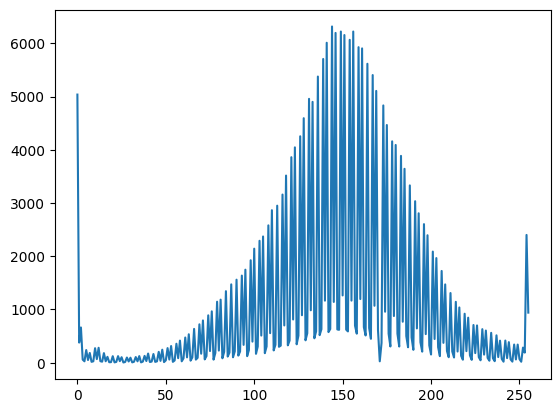

In [21]:
img_rio = cv2.imread('imagenes/rio.jpg', cv2.IMREAD_GRAYSCALE)

# histograma
rio_histr = cv2.calcHist([img_rio], [0], None, [256], [0, 256])
plt.plot(rio_histr)
plt.show()


interactive(children=(IntSlider(value=20, description='rango_min', max=255), IntSlider(value=60, description='…

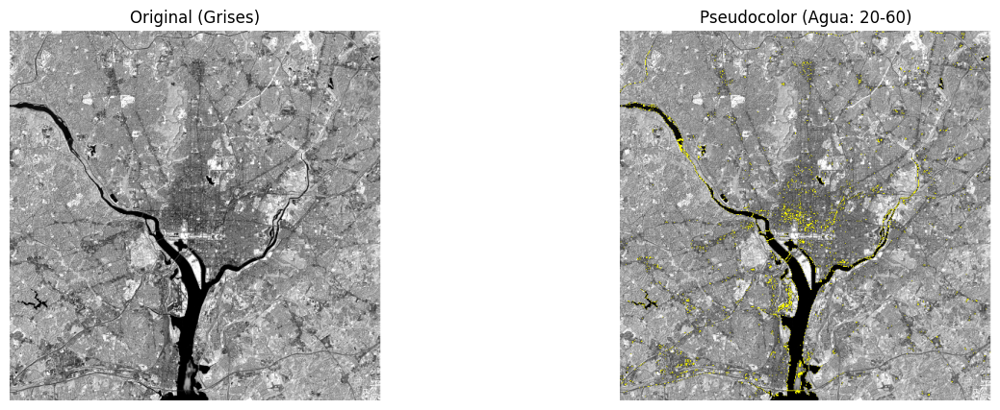

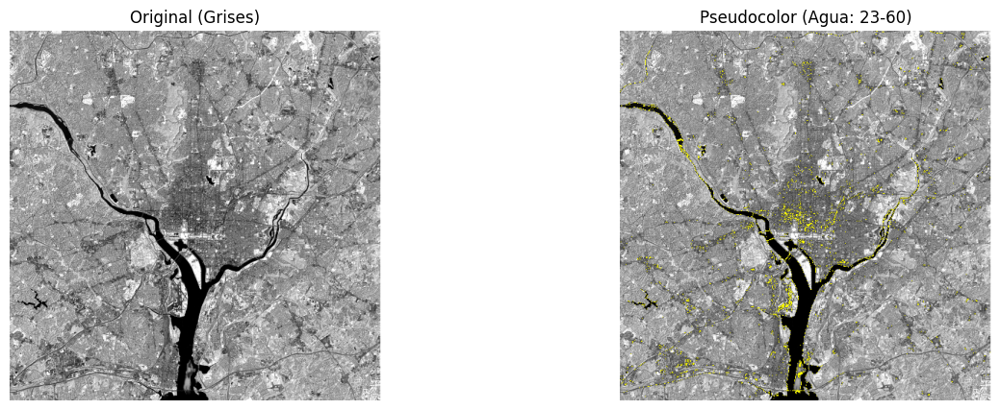

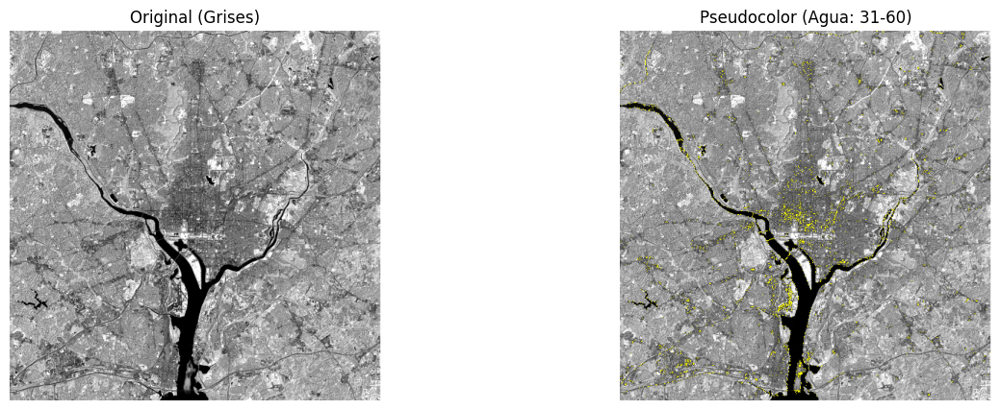

In [22]:
# Pseudocolor Interactivo
def aplicar_pseudocolor(rango_min, rango_max):
    # Generar imagen a color base (copia de intensidad)
    rio_color = cv2.cvtColor(img_rio, cv2.COLOR_GRAY2BGR)

    # Crear máscara de los píxeles que caen en el rango de agua
    mascara_agua = cv2.inRange(img_rio, rango_min, rango_max)

    # Asignar color amarillo (BGR: 0, 255, 255) a la zona detectada
    rio_color[mascara_agua > 0] = [0, 255, 255]

    mostrar_imagenes([img_rio, rio_color],
                     ["Original (Grises)", f"Pseudocolor (Agua: {rango_min}-{rango_max})"]);

# Interfaz para ajustar el rango de grises del agua visualmente [2]
interact(aplicar_pseudocolor,
         rango_min=IntSlider(min=0, max=255, step=1, value=20),
         rango_max=IntSlider(min=0, max=255, step=1, value=60));

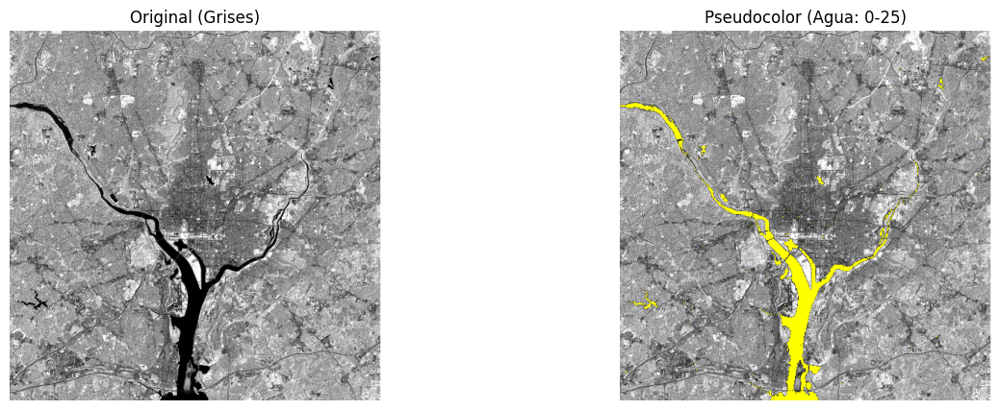

In [23]:
aplicar_pseudocolor(0, 25)

## Ejercicio 3: Procesamiento de imágenes en color

Evaluaremos la ecualización y el filtrado pasa-altos aplicando las operaciones sobre diferentes modelos **(RGB vs HSV vs HSI)**

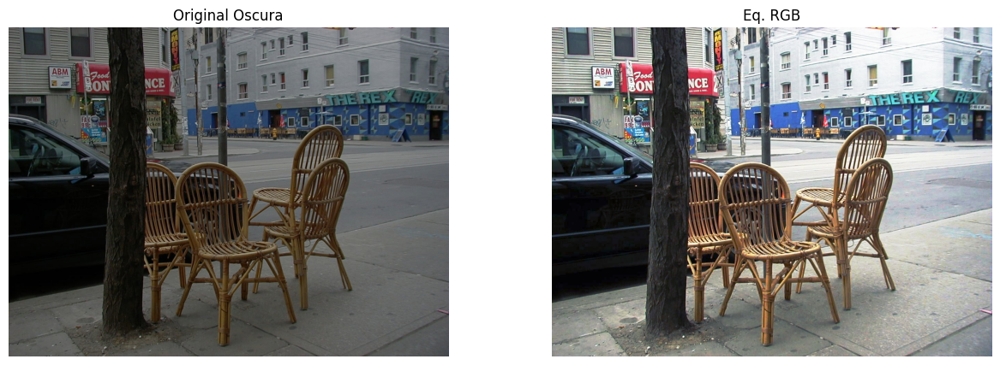

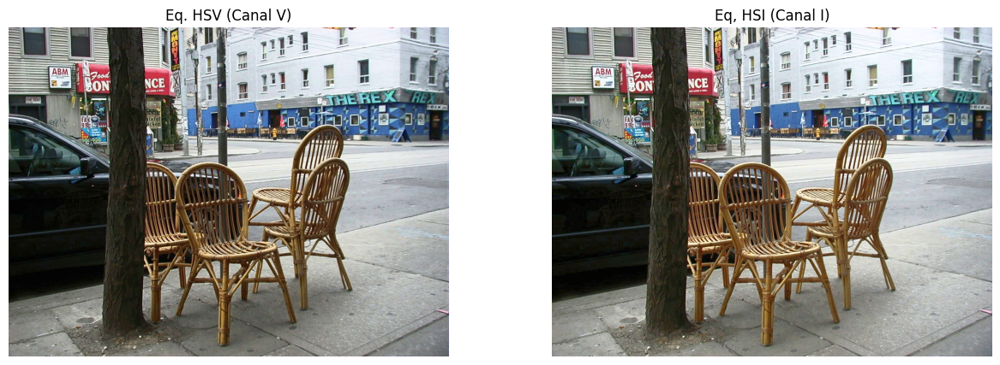

In [24]:
# Ecualización y Acentuado Multicanal

def calcular_canal_I_hsi(img_bgr):
    """Calcula el canal I del modelo HSI: I = (B+G+R)/3 [4]"""
    # IMPORTANTE: Sumar en uint8 desborda. Convertir a float primero.
    b, g, r = cv2.split(img_bgr.astype(np.float32))
    I = (b + g + r) / 3.0
    return I.astype(np.uint8)

def bgr2hsi(img_bgr):
    img_bgr = img_bgr.astype(np.float32) / 255.0
    # Obtener R, G, B
    B, G, R = cv2.split(img_bgr)

    # Calcular Intensidad como promedio de R, G, y B
    I = (R + G + B) / 3.0

    # Calcular Saturación como 1 - m/I
    min_BGR = np.min([R, G, B], axis=0)
    S = 1 - (3.0 * min_BGR) / (R + G + B + 1e-6)

    # Calculas Tono
    num = 0.5 * ((R - G) + (R - B))
    den = np.sqrt((R - G)**2 + (R - B) * (G - B))
    theta = np.arccos(np.clip(num / (den + 1e-6), -1.0, 1.0))
    H = theta.copy()
    H[B > G] = 2 * np.pi - H[B > G]
    H = H / (2 * np.pi)

    # Combinar los canales H, S, I en una sola imagen
    img_hsi = np.zeros_like(img_bgr)
    img_hsi[:, :, 0] = H
    img_hsi[:, :, 1] = S
    img_hsi[:, :, 2] = I

    return img_hsi

def hsi2bgr(img_hsi):
    # Obtener H, S, I
    H, S, I = img_hsi[:, :, 0], img_hsi[:, :, 1], img_hsi[:, :, 2]

    img_bgr = np.zeros_like(img_hsi)
    for x in range(img_hsi.shape[0]):  # Por cada pixel
        for y in range(img_hsi.shape[1]):
            h = H[x, y] * 2 * np.pi  # Convertir H de [0, 1] a [0, 2*pi]
            s = S[x, y]
            i = I[x, y]

            if h >= 0 and h < 2 * np.pi / 3:
                b = i * (1 - s)
                r = i * (1 + (s * np.cos(h)) / np.cos(np.pi / 3 - h))
                g = 3 * i - (r + b)
            elif h >= 2 * np.pi / 3 and h < 4 * np.pi / 3:
                h = h - 2 * np.pi / 3
                r = i * (1 - s)
                g = i * (1 + (s * np.cos(h)) / np.cos(np.pi / 3 - h))
                b = 3 * i - (r + g)
            else:
                h = h - 4 * np.pi / 3
                g = i * (1 - s)
                b = i * (1 + (s * np.cos(h)) / np.cos(np.pi / 3 - h))
                r = 3 * i - (g + b)

            # Mergeo los canales calculados, clipeo a [0,1] para la salida
            img_bgr[x, y, 0] = np.clip(b, 0, 1)
            img_bgr[x, y, 1] = np.clip(g, 0, 1)
            img_bgr[x, y, 2] = np.clip(r, 0, 1)

    return img_bgr

def procesar_color():
    # --- 3.1 Ecualización de Histograma --- [2]
    img_oscura = cv2.imread('imagenes/chairs_oscura.jpg')
    if img_oscura is not None:
        # a) Ecualización en RGB (Plano por plano)
        b, g, r = cv2.split(img_oscura)
        # TODO: Aplicar cv2.equalizeHist a b, g y r, luego hacer cv2.merge
        b_eq = cv2.equalizeHist(b)
        g_eq = cv2.equalizeHist(g)
        r_eq = cv2.equalizeHist(r)
        img_eq_rgb = cv2.merge([b_eq, g_eq, r_eq])

        # b) Ecualización en HSV (Solo canal V)
        img_hsv = cv2.cvtColor(img_oscura, cv2.COLOR_BGR2HSV)
        h, s, v = cv2.split(img_hsv)
        # TODO: Ecualizar 'v', hacer merge y volver a BGR
        v_eq = cv2.equalizeHist(v)
        img_eq_hsv = cv2.merge([h, s, v_eq])
        img_eq_hsv = cv2.cvtColor(img_eq_hsv, cv2.COLOR_HSV2BGR)

        # TODO: repetir comparativa con canal I -> usar calcular_canal_I_hsi()
        img_hsi = bgr2hsi(img_oscura)
        h, s, i = cv2.split(img_hsi)
        i_uint8 = (i * 255).astype(np.uint8)
        i_eq = cv2.equalizeHist(i_uint8)
        i_eq = i_eq.astype(np.float32) / 255.0
        img_eq_hsi = cv2.merge([h,s,i_eq])
        img_eq_hsi = hsi2bgr(img_eq_hsi)

        # Mostrar comparativa
        mostrar_imagenes([img_oscura, img_eq_rgb], ["Original Oscura", "Eq. RGB"])
        mostrar_imagenes([img_eq_hsv, img_eq_hsi], ["Eq. HSV (Canal V)", "Eq, HSI (Canal I)"])

procesar_color()

> En todos los casos tenemos buenos resultados (mayor contraste), pero en el caso de la ecualización por cada canal RGB los colores originales se ven alterados (puede verse en el color del arbol o las sillas). No se notan muchas diferencias entre el ecualizar el canal V de HSV y el canal I de HSI, pero el primero logra ligeramente un mejor contraste (ver el cartel vertical rojo/amarillo)

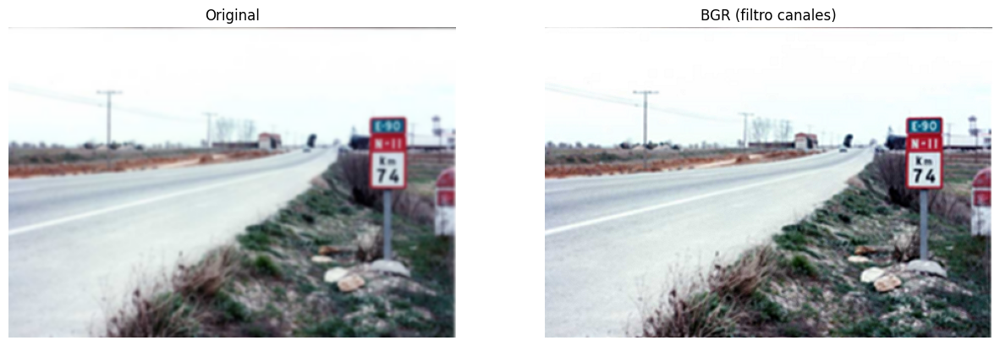

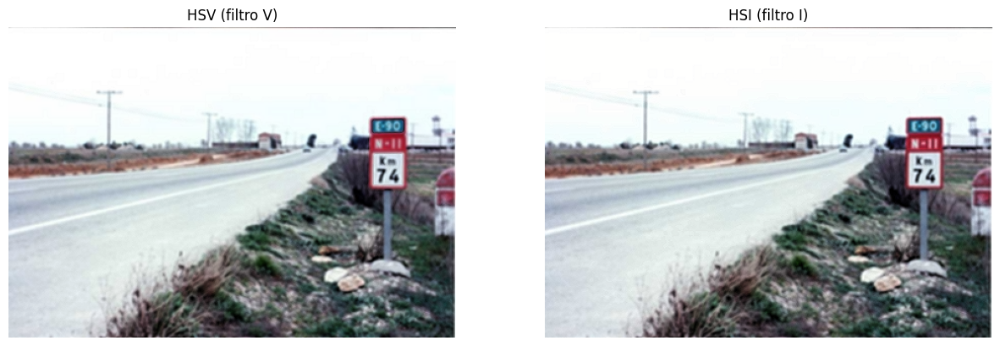

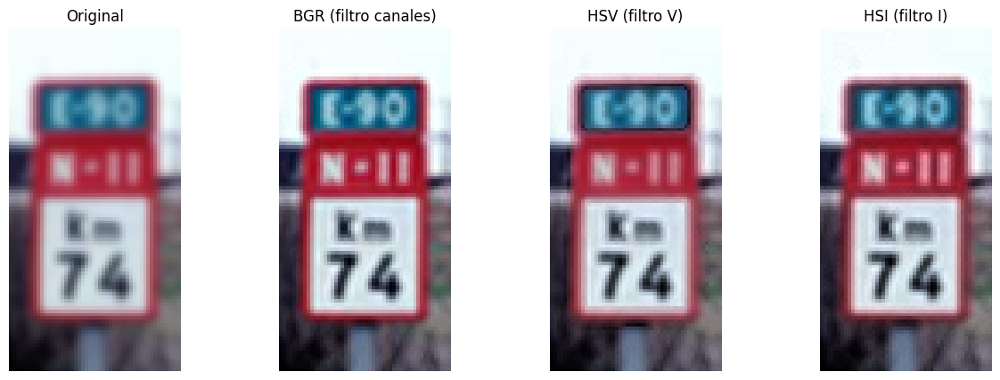

In [25]:
# --- 3.2 Realce mediante acentuado (Filtro Pasa-Altos)
img_desenfocada = cv2.imread('imagenes/camino.tif')
if img_desenfocada is not None:
    # TODO: Crear máscara pasa altos de suma 1 [9]
    kernel = np.array(
        [
            [0, -1, 0],
            [-1, 5,-1],
            [0, -1, 0]
        ], dtype=np.float32
    )

    # TODO: Aplicar filtro a los 3 canales RGB y comparar aplicándolo SÓLO al canal V de HSV.
    # BGR
    B, G, R = cv2.split(img_desenfocada)
    B_f = cv2.filter2D(B, -1, kernel)
    G_f = cv2.filter2D(G, -1, kernel)
    R_f = cv2.filter2D(R, -1, kernel)
    img_bgr_f = cv2.merge([B_f, G_f, R_f])

    # HSV
    H, S, V = cv2.split(cv2.cvtColor(img_desenfocada, cv2.COLOR_BGR2HSV))
    V_f = cv2.filter2D(V, -1, kernel)
    img_hsv_f = cv2.merge([H, S, V_f])
    img_hsv_f = cv2.cvtColor(img_hsv_f, cv2.COLOR_HSV2BGR)

    # HSI
    img_hsi = bgr2hsi(img_desenfocada)
    h, s, i = cv2.split(img_hsi)
    i_uint8 = (i * 255).astype(np.uint8)
    i_f = cv2.filter2D(i_uint8, -1, kernel)
    i_f = i_f.astype(np.float32) / 255.0
    img_hsi_f = cv2.merge([h,s,i_f])
    img_hsi_f = hsi2bgr(img_hsi_f)

    mostrar_imagenes([img_desenfocada, img_bgr_f], ["Original", "BGR (filtro canales)"])
    mostrar_imagenes([img_hsv_f, img_hsi_f], ["HSV (filtro V)", "HSI (filtro I)"])

    mostrar_imagenes([img_desenfocada[75:175, 350:400], img_bgr_f[75:175, 350:400], img_hsv_f[75:175, 350:400], img_hsi_f[75:175, 350:400]], ["Original", "BGR (filtro canales)", "HSV (filtro V)", "HSI (filtro I)"])

> No se notan grandes diferencias entre cada caso. Aunque el filtrado en rgb puede alterar (en este caso) ligeramente los colores originales, es el que obtuvo mejores resultados en cuanto a recuperar detalles, mientras que los HSI y HSV preservan mejor los colores. Puede verse un realce desproporcionado de un borde en el cartel en el caso de HSV, que podria interpretarse como un artefacto. En el caso de HSI, se obtuvo un mejor contraste de colores que en HSV.

## Ejercicios 4 y 5.1: Segmentación basada en color

Implementaremos una herramienta interactiva para segmentar por rangos de color, ideal para extraer camisetas de fútbol o tonos de piel.

* En el código usamos `cv.inRange()`. Analiza e implementa la versión matemática para RGB (esfera/elipsoide) y para HSV mencionadas en la guía.
    * **RGB**: Calcula la distancia euclidiana de cada píxel a un color central R,G,B y umbraliza por un radio.
    * **HSV**: Utilice las componentes H y S para determinar el subespacio rectangular a segmentar.


---


**Consejo**: utilizar los histogramas puede ser una buena alternativa para definir los valores de segmentación.


---


**Nota sobre video/webcam**: En Google Colab, la ejecución corre en un servidor remoto, por lo que procesar la webcam "on the fly" usando **cv2.VideoCapture(0)** no funcionará como en una PC local. Por ello, aquí nos enfocamos en imágenes estáticas interactivas.


interactive(children=(Text(value='imagenes/futbol.jpg', description='img_path'), IntRangeSlider(value=(50, 100…

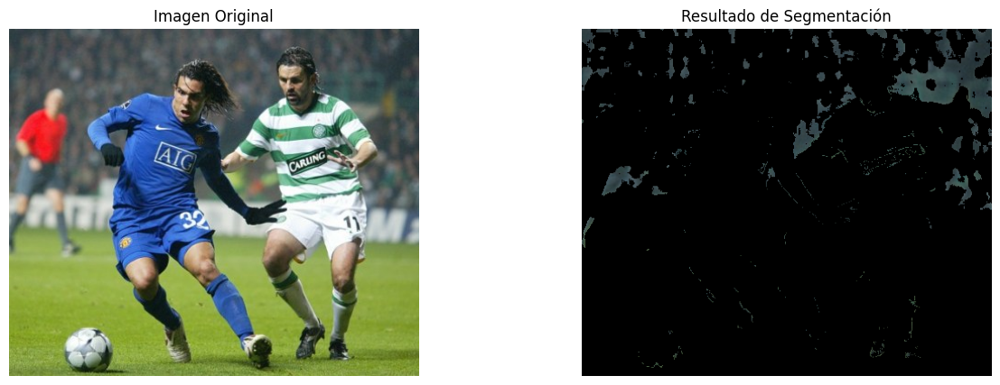

In [27]:
def segmentacion_hsv(img, h_rango, s_rango, v_rango):
    # Convertir a HSV
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Definir límites inferiores y superiores según los sliders
    lowerb = np.array([h_rango[0], s_rango[0], v_rango[0]])
    upperb = np.array([h_rango[1], s_rango[1], v_rango[1]])

    # Generar máscara con cv2.inRange
    mascara = cv2.inRange(img_hsv, lowerb, upperb)

    # Extraer información de interés usando cv2.bitwise_and
    segmentacion = cv2.bitwise_and(img, img, mask=mascara)

    return mascara, segmentacion

# Segmentación Interactiva
def actualizar(img_path, h_rango, s_rango, v_rango, mostrar_mascara):
    img = cv2.imread(img_path)
    if img is None: return "Sube la imagen seleccionada."

    mascara, segmentacion = segmentacion_hsv(img, h_rango, s_rango, v_rango)

    if mostrar_mascara:
        mostrar_imagenes([img, mascara], ["Imagen Original", "Máscara Generada"])
    else:
        mostrar_imagenes([img, segmentacion], ["Imagen Original", "Resultado de Segmentación"]);

# Configuración de los controles interactivos
interact(actualizar,
         img_path='imagenes/futbol.jpg', # Agrega otras imágenes aquí
         h_rango=IntRangeSlider(min=0, max=179, value=[50, 100], description='Matiz (H)'),
         s_rango=IntRangeSlider(min=0, max=255, value=[50, 100], description='Saturación (S)'),
         v_rango=IntRangeSlider(min=0, max=255, value=[50, 100], description='Brillo (V)'),
         mostrar_mascara=Checkbox(value=False, description='Ver solo máscara'));

El mejor resultado con mascara HSV se obtiene con $H\in[97,161], S\in[127,255], V\in[0,255]$

In [30]:
def segmentacion_rgb(img, x_rango, y_rango, radio):
    # generar mascara a partir de ROI
    roi = img[y_rango[0]:y_rango[1], x_rango[0]:x_rango[1]]
    B, G, R = cv2.split(roi)
    maxB = np.argmax(np.histogram(B,np.arange(256))[0])  # azul mas frecuente
    maxG = np.argmax(np.histogram(G,np.arange(256))[0])  # verde mas frecuente
    maxR = np.argmax(np.histogram(R,np.arange(256))[0])  # rojo mas frecuente

    # generar máscara:
    H,W,_ = img.shape
    mascara = np.zeros((H,W),np.uint8)

    # pixel a pixel: si el color (rgb) del pixel se encuentra a una distancia euclidea menor a 'radio', messirve
    for i in range(H):  # recorremos píxel a píxel
        for j in range(W):
            if ((maxB - img[i][j][0])**2 + (maxG - img[i][j][1])**2 + (maxR - img[i][j][2])**2) <= radio**2:
                mascara[i][j]=255

    # Extraer información de interés usando cv2.bitwise_and
    segmentacion = cv2.bitwise_and(img, img, mask=mascara)

    return roi, mascara, segmentacion

def actualizar(img_path, x_rango, y_rango, radio, mostrar_mascara):
    img = cv2.imread(img_path)
    if img is None: return "Sube la imagen seleccionada."
    if x_rango[0] > img.shape[0] or x_rango[1] > img.shape[0] or y_rango[0] > img.shape[1] or y_rango[1] > img.shape[1]: return "Rango fuera de la imagen."

    roi, mascara, segmentacion = segmentacion_rgb(img, x_rango, y_rango, radio)

    if mostrar_mascara:
        mostrar_imagenes([img, roi, mascara], ["Imagen Original", "ROI", "Máscara Generada"])
    else:
        mostrar_imagenes([img, roi, segmentacion], ["Imagen Original", "ROI", "Resultado de Segmentación"]);

interact(actualizar,
         img_path='imagenes/futbol.jpg', # Agrega otras imágenes aquí
         x_rango=IntRangeSlider(min=0, max=500, value=[50, 100], description='ROI [xini, xfin]'),
         y_rango=IntRangeSlider(min=0, max=500, value=[50, 100], description='ROI [yini, yfin]'),
         radio=FloatSlider(min=1, max=100, value=10, description='Radio'),
         mostrar_mascara=Checkbox(value=False, description='Ver solo máscara'));

interactive(children=(Text(value='imagenes/futbol.jpg', description='img_path'), IntRangeSlider(value=(50, 100…

El mejor resultado con mascara RGB se encontró con $ROIx\in[141,193], ROIy\in[154,200], R=85$

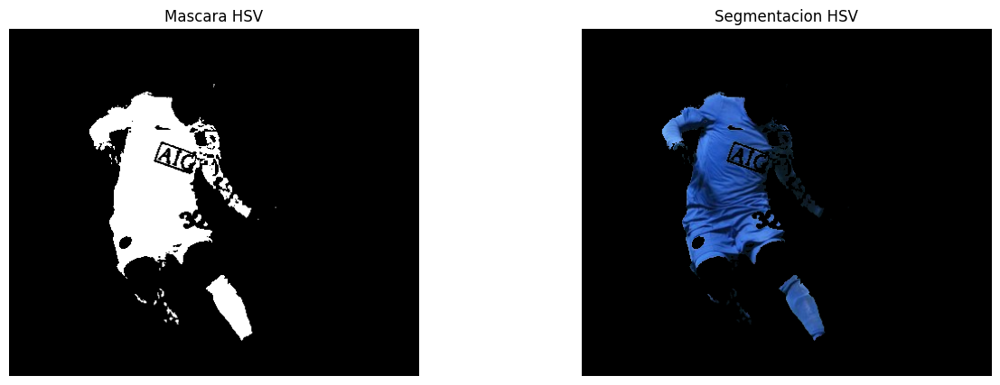

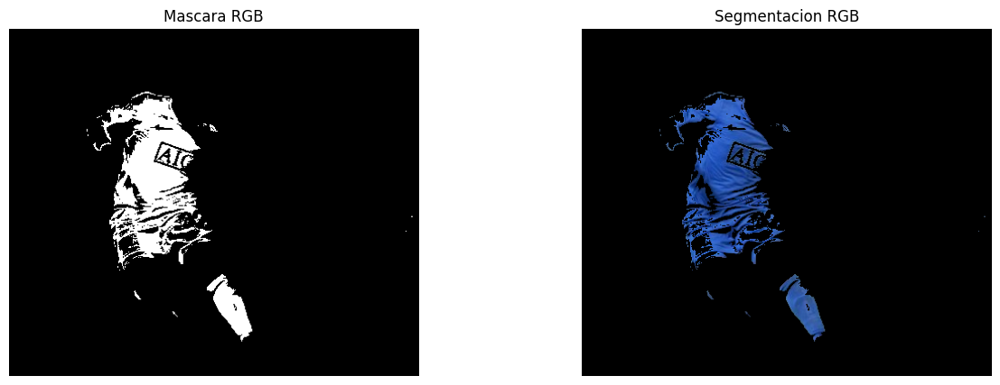

In [32]:
h_rango, s_rango, v_rango = [[97,161], [127,255], [0,255]]
x_rango, y_rango, radio = [[141,193], [154,200], 85]
img = cv2.imread('imagenes/futbol.jpg')
mascara_hsv, seg_hsv = segmentacion_hsv(img, h_rango, s_rango, v_rango)
_, mascara_rgb, seg_rgb = segmentacion_rgb(img, x_rango, y_rango, radio)

mostrar_imagenes([mascara_hsv, seg_hsv], ["Mascara HSV", "Segmentacion HSV"])
mostrar_imagenes([mascara_rgb, seg_rgb], ["Mascara RGB", "Segmentacion RGB"])

Se obtuvieron mucho mejores resultados con la segmentacion HSV, ademas de dar mas control a la hora de buscar el area de interes. Se lograron obtener las partes mas iluminadas y algunas de las mas oscurecidas, ademas de tener menos ruido que la RGB. Además, el resultado de la RGB cambia mucho despecto a la ROI seleccionada, incluso con cambios muy pequeños.

### Caras

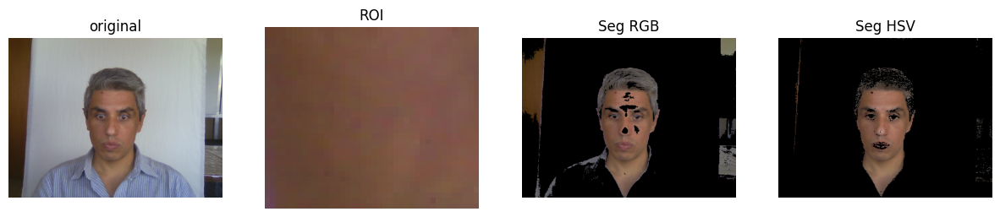

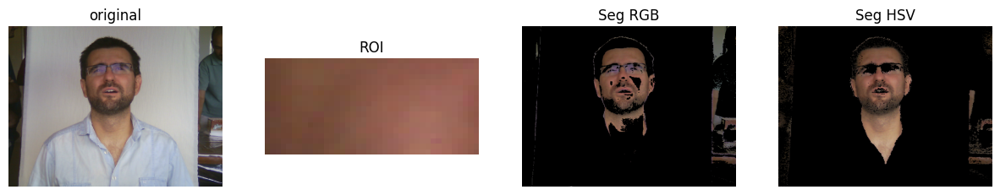

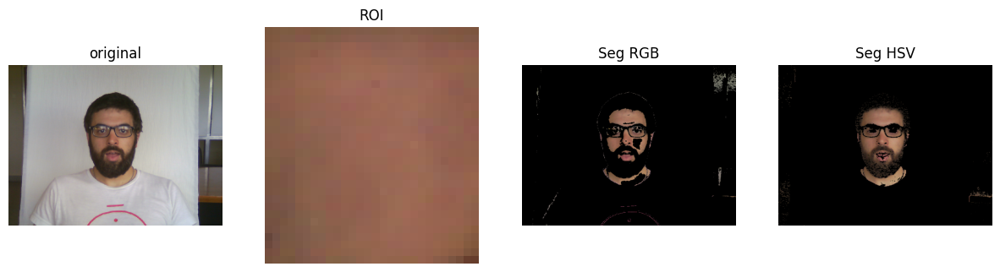

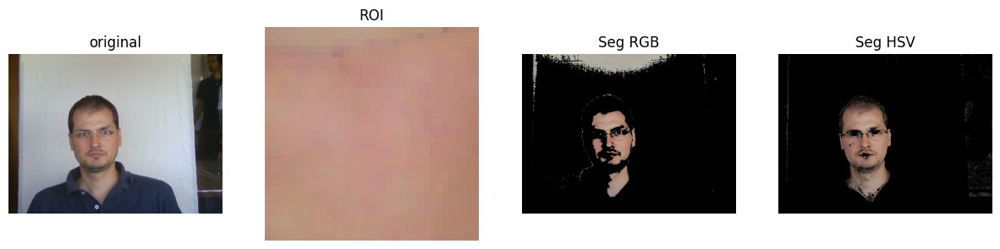

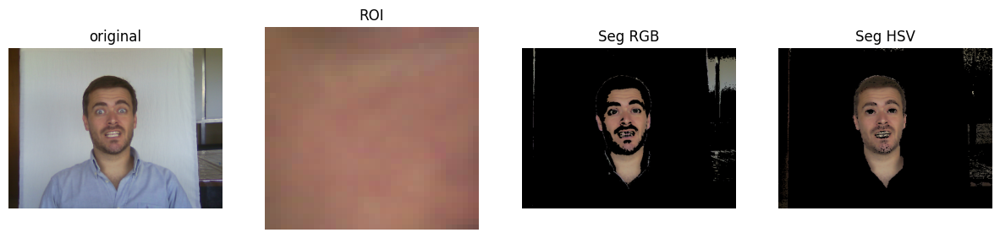

In [33]:
img_CM = cv2.imread('imagenes/s01_i08_H_CM.png')
img_DM = cv2.imread('imagenes/s03_i10_H_DM.png')
img_LB = cv2.imread('imagenes/s05_i08_H_LB.png')
img_LV = cv2.imread('imagenes/s06_i13_H_LV.png')
img_MA = cv2.imread('imagenes/s08_i06_H_MA.png')

h_rango, s_rango, v_rango = [[2,20], [25,152], [56,185]]
x_rango, y_rango, radio = [[246,286], [272,306], 70]
mascara_hsv_CM, segmentacion_hsv_CM = segmentacion_hsv(img_CM, h_rango, s_rango, v_rango)
roi_CM, mascara_rgb_CM, segmentacion_rgb_CM = segmentacion_rgb(img_CM, x_rango, y_rango, radio)

h_rango, s_rango, v_rango = [[2,20], [46,152], [0,255]]
x_rango, y_rango, radio = [[237,277], [155,173], 59]
mascara_hsv_DM, segmentacion_hsv_DM = segmentacion_hsv(img_DM, h_rango, s_rango, v_rango)
roi_DM, mascara_rgb_DM, segmentacion_rgb_DM = segmentacion_rgb(img_DM, x_rango, y_rango, radio)

h_rango, s_rango, v_rango = [[0,17], [81,150], [0,226]]
x_rango, y_rango, radio = [[260,288], [218,249], 52]
mascara_hsv_LB, segmentacion_hsv_LB = segmentacion_hsv(img_LB, h_rango, s_rango, v_rango)
roi_LB, mascara_rgb_LB, segmentacion_rgb_LB = segmentacion_rgb(img_LB, x_rango, y_rango, radio)

h_rango, s_rango, v_rango = [[1,16], [31,136], [35,226]]
x_rango, y_rango, radio = [[281,316], [254,289], 53]
mascara_hsv_LV, segmentacion_hsv_LV = segmentacion_hsv(img_LV, h_rango, s_rango, v_rango)
roi_LV, mascara_rgb_LV, segmentacion_rgb_LV = segmentacion_rgb(img_LV, x_rango, y_rango, radio)

h_rango, s_rango, v_rango = [[0,25], [31,136], [35,226]]
x_rango, y_rango, radio = [[253,292], [200,237], 53]
mascara_hsv_MA, segmentacion_hsv_MA = segmentacion_hsv(img_MA, h_rango, s_rango, v_rango)
roi_MA, mascara_rgb_MA, segmentacion_rgb_MA = segmentacion_rgb(img_MA, x_rango, y_rango, radio)

mostrar_imagenes([img_CM, roi_CM, segmentacion_rgb_CM, segmentacion_hsv_CM], ["original", "ROI", "Seg RGB", "Seg HSV"])
mostrar_imagenes([img_DM, roi_DM, segmentacion_rgb_DM, segmentacion_hsv_DM], ["original", "ROI", "Seg RGB", "Seg HSV"])
mostrar_imagenes([img_LB, roi_LB, segmentacion_rgb_LB, segmentacion_hsv_LB], ["original", "ROI", "Seg RGB", "Seg HSV"])
mostrar_imagenes([img_LV, roi_LV, segmentacion_rgb_LV, segmentacion_hsv_LV], ["original", "ROI", "Seg RGB", "Seg HSV"])
mostrar_imagenes([img_MA, roi_MA, segmentacion_rgb_MA, segmentacion_hsv_MA], ["original", "ROI", "Seg RGB", "Seg HSV"])

Se encontraron los parametros para cada cara usando la herramienta interactiva anterior.

Una vez mas, el método por HSV es mas flexible y es mas sencillo encontrar los parámetros que hacen a una buena segmentacion. En general RGB tiene mas problemas con el bello facial o el pelo, mientras que HSV presentó más problemas con los ojos o la boca.

En general tendremos problemas para segmentar cuando parte del fondo tenga valores cercanos a los de la piel (foto 1 o 4), haya partes de interes con distintos tonos (la barba de la foto 3, o el cuello en la foto 2) o **la iluminación no es homogenea** (foto 4), y habrá que encontrar valores de parámetros distintos para cada foto, no hay un conjunto de parámetros que funcionen para todas.

Algunas condiciones sí son homogeneas, como la distancia cámara objeto, el foco, la ubicación y pose del objeto; aunque otras no, como la vestimenta el fondo (pueden verse elementos distintos en las fotos 2 y 4).

Algunas consideraciones para la base de datos:

- Misma iluminación, buena y constante a lo largo de la imagen.
- Sujetos centrados en la misma posición y sin moverse.
- Fondo homogeneo.
- Foto enfocada y sin movimiento.

## Trabajo de Aplicación: 5.2 - Detección de Deforestación

El gobierno de Misiones requiere segmentar y resaltar zonas deforestadas, calculando su área en base a la escala provista en la imagen **Deforestacion.png**.

Nota: Extraer la barra de referencia en la esquina inferior izquierda.

> Primero analizamos los canales sobre distintos perfiles para encontrar cuales contrastan mejor en las areas de interes

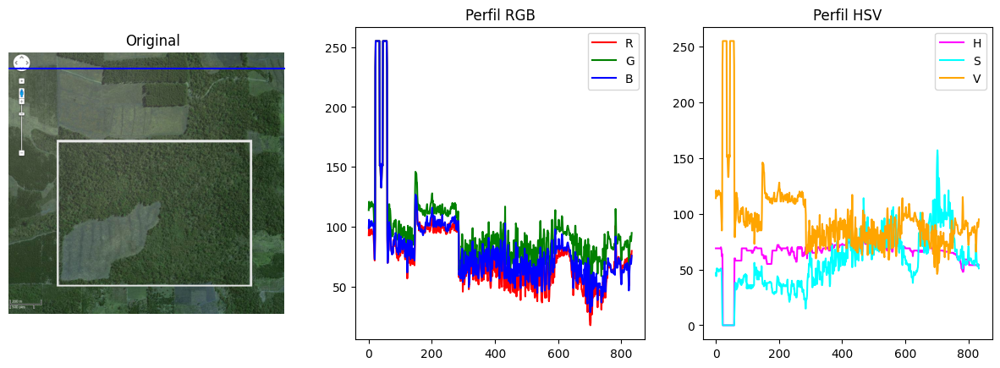

In [34]:
# Caso: Misiones
img = cv2.imread('imagenes/Deforestacion.png')
B, G, R = cv2.split(img)
H, S, V = cv2.split(cv2.cvtColor(img, cv2.COLOR_BGR2HSV))

def analisis_deforestacion(fila):
    # PASO 1: Analizar canales
    fig, ax = plt.subplots(1, 3)
    fig.set_figwidth(15)

    ax[0].imshow(img)
    ax[0].plot([0,img.shape[1]], [fila, fila], c="blue")
    ax[0].set_title("Original")
    ax[0].axis('off')

    ax[1].plot(R[fila,:], c="red", label="R")
    ax[1].plot(G[fila,:], c="green", label="G")
    ax[1].plot(B[fila,:], c="blue", label="B")
    ax[1].set_title("Perfil RGB")
    ax[1].legend()

    ax[2].plot(H[fila,:], c="magenta", label="H")
    ax[2].plot(S[fila,:], c="cyan", label="S")
    ax[2].plot(V[fila,:], c="orange", label="V")
    ax[2].set_title("Perfil HSV")
    ax[2].legend();

interact(analisis_deforestacion,
         fila=IntSlider(min=0, max=img.shape[0], value=50, description='fila'));

> Aca vemos que los canales HSV contrastan bien dentro del area de interes, por lo que la segmentacion en estos es la mas lógica.
>
> Además agregamos trackbars para delimitar el area a segmentar, descartando lo que esté fuera de ésta.

interactive(children=(IntRangeSlider(value=(155, 729), description='x', max=834), IntRangeSlider(value=(275, 7…

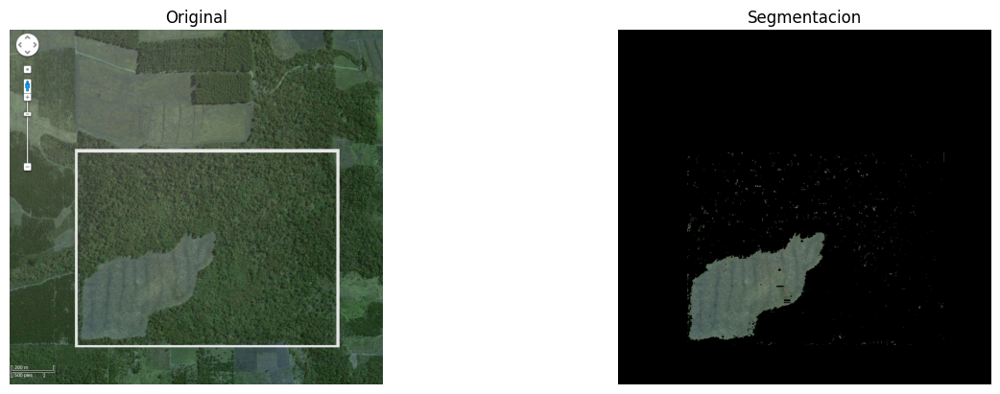

In [35]:
img = cv2.imread('imagenes/Deforestacion.png')
def analisis_deforestacion(x_range, y_range, h_rango, s_rango, v_rango, mostrar_mascara):
    img_resultado = img.copy()

    # PASO 2: Segmentar el área deforestada
    mascara, _ = segmentacion_hsv(img, h_rango, s_rango, v_rango)
    mascara[:y_range[0],:] = 0
    mascara[y_range[1]:,:] = 0
    mascara[:,:x_range[0]] = 0
    mascara[:,x_range[1]:] = 0
    segmentacion = cv2.bitwise_and(img, img, mask=mascara)

    fig, ax = plt.subplots(1, 2)
    fig.set_figwidth(15)

    ax[0].imshow(img)
    ax[0].set_title("Original")
    ax[0].axis('off')

    if mostrar_mascara:
        ax[1].imshow(mascara, cmap='gray')
        ax[1].set_title("Mascara")
        ax[1].axis('off');
    else:
        ax[1].imshow(segmentacion)
        ax[1].set_title("Segmentacion")
        ax[1].axis('off');

interact(analisis_deforestacion,
         x_range=IntRangeSlider(min=0, max=img.shape[1], value=[155,729], description='x'),
         y_range=IntRangeSlider(min=0, max=img.shape[0], value=[275,706], description='y'),
         h_rango=IntRangeSlider(min=0, max=179, value=[0, 68], description='Matiz (H)'),
         s_rango=IntRangeSlider(min=0, max=255, value=[0, 58], description='Saturación (S)'),
         v_rango=IntRangeSlider(min=0, max=255, value=[81, 255], description='Brillo (V)'),
         mostrar_mascara=Checkbox(value=False, description='máscara'));

> Vemos que los rangos para la segmentación que mejor resultados arrojan son $H\in[0,68], S\in[0,58], V\in[81,255]$, con area en $x\in[155, 729], y\in[275,706]$

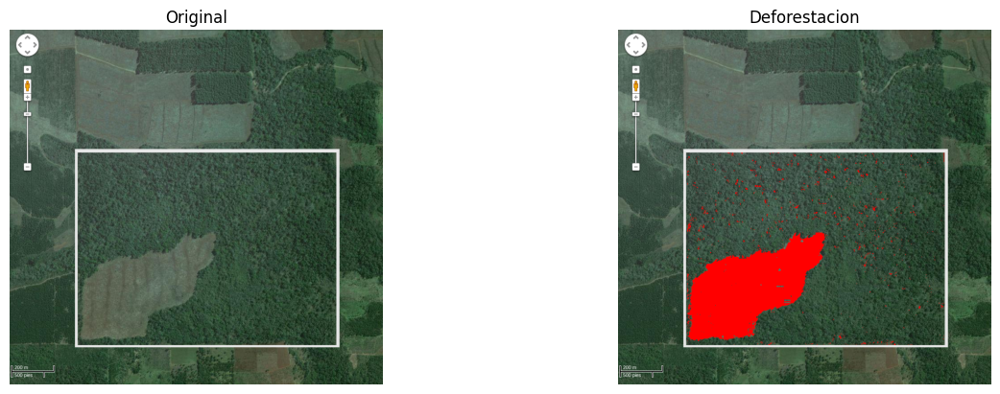

In [36]:
def analisis_deforestacion():
    img = cv2.imread('imagenes/Deforestacion.png')
    # PASO 3: Resaltar en rojo
    h_rango=[0, 68]
    s_rango=[0, 58]
    v_rango=[81, 255]
    x_range=[155,729]
    y_range=[275,706]
    mascara, _ = segmentacion_hsv(img, h_rango, s_rango, v_rango)
    mascara[:y_range[0],:] = 0
    mascara[y_range[1]:,:] = 0
    mascara[:,:x_range[0]] = 0
    mascara[:,x_range[1]:] = 0
    img_resultado = img.copy()
    img_resultado[mascara > 0] =  [0, 0, 255]

    fig, ax = plt.subplots(1, 2)
    fig.set_figwidth(15)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[0].imshow(img)
    ax[0].set_title("Original")
    ax[0].axis('off')

    img_resultado = cv2.cvtColor(img_resultado, cv2.COLOR_BGR2RGB)
    ax[1].imshow(img_resultado)
    ax[1].set_title("Deforestacion")
    ax[1].axis('off');

analisis_deforestacion()

--- REPORTE DE DEFORESTACIÓN ---
Área delimitada total: 98.96 ha
Área de monte nativo: 81.37 ha
Área deforestada: 17.59 ha


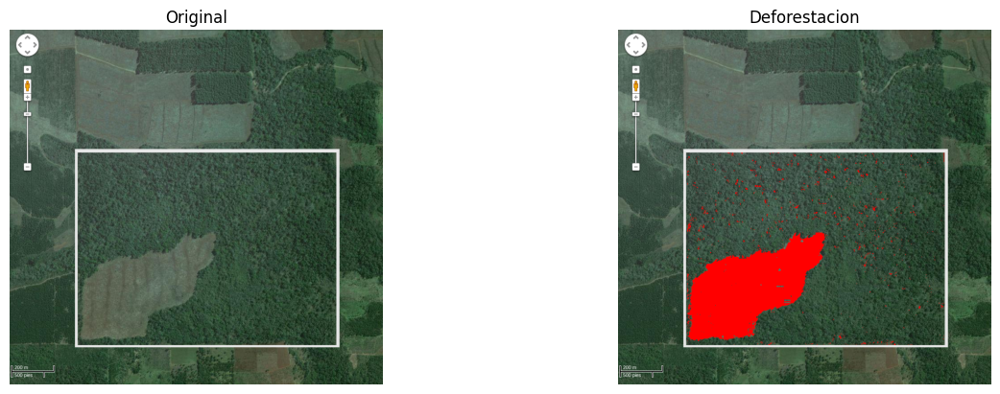

In [37]:
def analisis_deforestacion():
    img = cv2.imread('imagenes/Deforestacion.png')
    if img is None: return "Por favor, carga 'Deforestacion.png'."

    # PASO 3: Resaltar en rojo
    h_rango=[0, 68]
    s_rango=[0, 58]
    v_rango=[81, 255]
    x_range=[155,729]
    y_range=[275,706]
    mascara_deforestada, _ = segmentacion_hsv(img, h_rango, s_rango, v_rango)
    mascara_deforestada[:y_range[0],:] = 0
    mascara_deforestada[y_range[1]:,:] = 0
    mascara_deforestada[:,:x_range[0]] = 0
    mascara_deforestada[:,x_range[1]:] = 0
    img_resultado = img.copy()
    img_resultado[mascara_deforestada > 0] =  [0, 0, 255]

    # PASO 4: Cálculo de Áreas (Hectáreas)
    # La barra de referencia (200m) mide unos 100 pixeles, por lo que tomamos 1px = 4m^2 = 1/2500 ha
    area_por_pixel = 1.0/2500.0 # ha

    area_total_ha = area_por_pixel * (x_range[1]-x_range[0])*(y_range[1]-y_range[0])
    area_deforestada_ha = area_por_pixel * cv2.countNonZero(mascara_deforestada)
    area_monte_ha = area_total_ha - area_deforestada_ha

    # Imprimir reporte
    print("--- REPORTE DE DEFORESTACIÓN ---")
    print(f"Área delimitada total: {area_total_ha:.2f} ha")
    print(f"Área de monte nativo: {area_monte_ha:.2f} ha")
    print(f"Área deforestada: {area_deforestada_ha:.2f} ha")

    fig, ax = plt.subplots(1, 2)
    fig.set_figwidth(15)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax[0].imshow(img)
    ax[0].set_title("Original")
    ax[0].axis('off')

    img_resultado = cv2.cvtColor(img_resultado, cv2.COLOR_BGR2RGB)
    ax[1].imshow(img_resultado)
    ax[1].set_title("Deforestacion")
    ax[1].axis('off');

analisis_deforestacion()